
<h3><font color = darkgreen> Zeeshan<br>
Student at iqra.edu.pk<br>
Reg# 35342  - BSCS - 4th year<br>
Emial: imzeeshan.ai@gmail.com
    </font></h3>

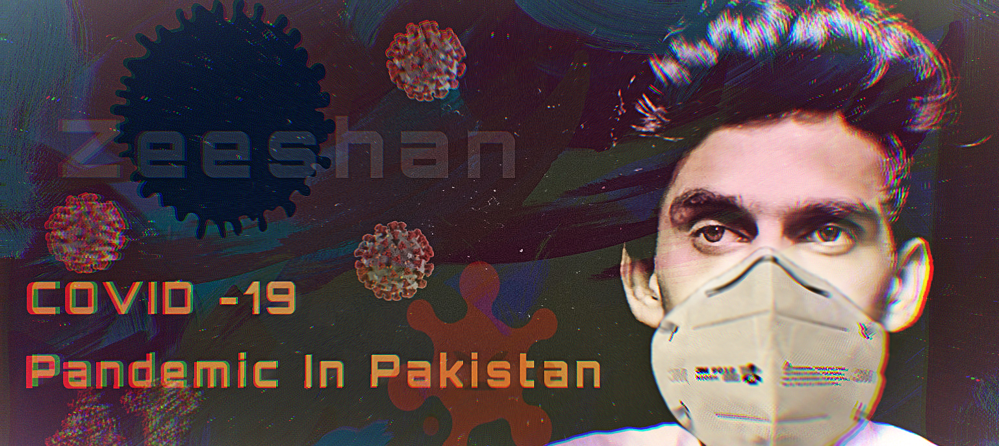

In [8]:
from IPython.display import Image
Image("zee.jpg")

#  <h1> <font color = darkorange> COVID-19 CORONAVARIOUS Pandemic in pakistan</font><h1>

###  <font color = black> Importing Required Labraries</font>


In [9]:
# importing the required libraries
import pandas as pd

# Visualisation libraries
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight') # Above is a special style template for matplotlib, highly useful for visualizing time series data
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium 
from folium import plugins

# Manipulating the default plot size
plt.rcParams['figure.figsize'] = 10, 12

# Disable warnings 
import warnings
warnings.filterwarnings('ignore')

# <font color = darkyellow>Recent COVID -19 Cases in Pakistan 

In [10]:
df = pd.read_excel('Covid cases in Pakistan.xlsx')
df.head()

,Name of State / UT,Total Confirmed cases(Pak Nation),Total Confirmed cases(Forign Nation),Cured,Deaths,Total cases
0,Sindh,413,0,14,1,413
1,Panjab,296,0,3,1,296
2,Balochistan,115,0,0,1,115
3,GB,81,0,0,1,81
4,KPK,78,0,0,3,78


In [11]:
df.describe()

,Total Confirmed cases(Pak Nation),Total Confirmed cases(Forign Nation),Cured,Deaths,Total cases
count,7.000000,7.0,7.000000,7.0,7.000000
mean,142.857143,0.0,2.714286,1.0,142.857143
std,153.544161,0.0,5.122313,1.0,153.544161
min,1.000000,0.0,0.000000,0.0,1.000000
25%,47.000000,0.0,0.000000,0.5,47.000000
50%,81.000000,0.0,0.000000,1.0,81.000000
75%,205.500000,0.0,2.500000,1.0,205.500000
max,413.000000,0.0,14.000000,3.0,413.000000


### <font color = darkyellow>Correlation</font> 

In [12]:
df_corr = df[['Name of State / UT','Total Confirmed cases(Pak Nation)','Total Confirmed cases(Forign Nation)','Cured','Deaths','Total cases']].corr()
df_corr

,Total Confirmed cases(Pak Nation),Total Confirmed cases(Forign Nation),Cured,Deaths,Total cases
Total Confirmed cases(Pak Nation),1.000000,NaN,0.845032,0.150880,1.000000
Total Confirmed cases(Forign Nation),NaN,NaN,NaN,NaN,NaN
Cured,0.845032,NaN,1.000000,-0.065075,0.845032
Deaths,0.150880,NaN,-0.065075,1.000000,0.150880
Total cases,1.000000,NaN,0.845032,0.150880,1.000000


In [13]:
# is Null Values
df.info(null_counts = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 6 columns):
Name of State / UT                      7 non-null object
Total Confirmed cases(Pak Nation)       7 non-null int64
Total Confirmed cases(Forign Nation)    7 non-null int64
Cured                                   7 non-null int64
Deaths                                  7 non-null int64
Total cases                             7 non-null int64
dtypes: int64(5), object(1)
memory usage: 464.0+ bytes


In [14]:
#Cordinates of Pakistan States 
Pakistan_coord = pd.read_excel('Pakistan Coordinates.xlsx')
# Coordinates of Pakistan States and Union Territories
Pakistan_coord = pd.read_excel('Pakistan Coordinates.xlsx')

#Day by day data of Pakistan, Korea, Italy and Wuhan
dbd_Pakistan = pd.read_excel('per_day_cases.xlsx',parse_dates=True, sheet_name = 'Pakistan')
dbd_Italy = pd.read_excel('per_day_cases.xlsx',parse_dates=True, sheet_name="Italy")
dbd_Korea = pd.read_excel('per_day_cases.xlsx',parse_dates=True, sheet_name="Korea")
dbd_Wuhan = pd.read_excel('per_day_cases.xlsx',parse_dates=True, sheet_name="Wuhan")

dbd_Pakistan.tail()

,Date,Total Cases,New Cases,Days after surpassing 100 cases
50,2020-03-20,495,34,4.0
51,2020-03-21,646,151,5.0
52,2020-03-22,784,138,6.0
53,2020-03-23,887,103,7.0
54,2020-03-24,991,104,8.0


In [15]:


#Learn how to play around with the dataframe and create a new attribute of 'Total Case'
#Total case is the total number of confirmed cases (Indian National + Foreign National)

df['Total cases'] = df['Total Confirmed cases(Pak Nation)'] + df['Total Confirmed cases(Forign Nation)']
total_cases = df['Total cases'].sum()
print('Total number of confirmed COVID 2019 cases across Pakistan till date (26th March, 2020):', total_cases)


Total number of confirmed COVID 2019 cases across Pakistan till date (26th March, 2020): 1000


In [16]:
#highlight 
df.style.background_gradient(cmap='Reds') 

,Name of State / UT,Total Confirmed cases(Pak Nation),Total Confirmed cases(Forign Nation),Cured,Deaths,Total cases
0,Sindh,413,0,14,1,413
1,Panjab,296,0,3,1,296
2,Balochistan,115,0,0,1,115
3,GB,81,0,0,1,81
4,KPK,78,0,0,3,78
5,ICT,16,0,2,0,16
6,AJK,1,0,0,0,1


# <font color = red><b>Number of active COVID-19 cases in affected states</font>

In [17]:


#Total Active  is the Total cases - (Number of death + Cured)
df['Total Active'] = df['Total cases'] - (df['Deaths'] + df['Cured'])
total_active = df['Total Active'].sum()
print('Total number of active COVID 2019 cases across Pakistan:', total_active)
Tot_Cases = df.groupby('Name of State / UT')['Total Active'].sum().sort_values(ascending=False).to_frame()
Tot_Cases.style.background_gradient(cmap='Reds')

Total number of active COVID 2019 cases across Pakistan: 974


,Total Active
Name of State / UT,
Sindh,398
Panjab,292
Balochistan,114
GB,80
KPK,75
ICT,14
AJK,1


#   <font color=darkyellow> Visualing the spread geographically </font>

In [18]:
# Learn how to use folium to create a zoomable map

df_full = pd.merge(Pakistan_coord,df,on='Name of State / UT')
map = folium.Map(location=[30, 70], zoom_start=5,tiles='Stamenterrain')

for lat, lon, value, name in zip(df_full['Latitude'], df_full['Longitude'], df_full['Total cases'], df_full['Name of State / UT']):
    folium.CircleMarker([lat, lon], radius=value*0.12, popup = ('<strong>State</strong>: ' + str(name).capitalize() + '<br>''<strong>Total Cases</strong>: ' + str(value) + '<br>'),color='red',fill_color='red',fill_opacity=0.3 ).add_to(map)
map

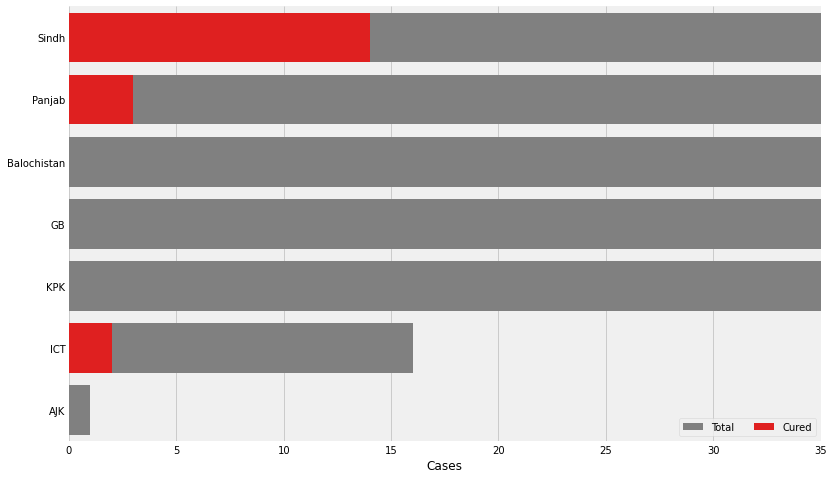

In [19]:
#Learn how to use Seaborn for visualization
f, ax = plt.subplots(figsize=(12, 8))
data = df_full[['Name of State / UT','Total cases','Cured','Deaths']]
data.sort_values('Total cases',ascending=False,inplace=True)
sns.set_color_codes("pastel")
sns.barplot(x="Total cases", y="Name of State / UT", data=data,label="Total", color="gray")

sns.set_color_codes("muted")
sns.barplot(x="Cured", y="Name of State / UT", data=data, label="Cured", color="red")


# Add a legend and informative axis label
ax.legend(ncol=2, loc="lower right", frameon=True)
ax.set(xlim=(0, 35), ylabel="",xlabel="Cases")
sns.despine(left=True, bottom=True)

In [115]:
#Learn how to create interactive graphs using plotly
# import plotly.graph_objects as go
# Rise of COVID-19 cases in Pakistan

import plotly
plotly.io.renderers.default = 'notebook'

fig = go.Figure()
fig.add_trace(go.Scatter(x=dbd_Pakistan['Date'], y = dbd_Pakistan['Total Cases'], mode='lines+markers',name='Total Cases'))
fig.update_layout(title_text='Trend of Coronavirus Cases in Pakistan (Cumulative cases)',plot_bgcolor='rgb(230, 230,230)')
fig.show()

# New COVID-19 cases reported daily in Pakistan

import plotly.express as px
fig = px.bar(dbd_Pakistan, x="Date", y="New Cases", barmode='group', height=400)
fig.update_layout(title_text='Coronavirus Cases in Pakistan on daily basis',plot_bgcolor='rgb(230, 230, 230)')

fig.show()

# <font color= darkyellow>Part 2: Is the trend similar to Italy/ S.Korea/ Wuhan?

Pakistan has already crossed 900 cases. It is very important to contain the situation in the coming week.The numbers of coronavirus patients starting doubling after these countries hit the 900 mark and almost starting increasing exponentially.


##  <font color= darkyellow>Cumulative cases in Pakistan, Italy, S.Korea, and Wuhan

In [20]:
# import plotly.express as px
fig = px.bar(dbd_Pakistan, x="Date", y="Total Cases", color='Total Cases', orientation='v', height=600,
             title='Confirmed Cases in Pakistan', color_discrete_sequence = px.colors.cyclical.IceFire)

'''Colour Scale for plotly
https://plot.ly/python/builtin-colorscales/
'''

fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

fig = px.bar(dbd_Italy, x="Date", y="Total Cases", color='Total Cases', orientation='v', height=600,
             title='Confirmed Cases in Italy', color_discrete_sequence = px.colors.cyclical.IceFire)

fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()





In [21]:
fig = px.bar(dbd_Korea, x="Date", y="Total Cases", color='Total Cases', orientation='v', height=600,
             title='Confirmed Cases in South Korea', color_discrete_sequence = px.colors.cyclical.IceFire)

fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

fig = px.bar(dbd_Wuhan, x="Date", y="Total Cases", color='Total Cases', orientation='v', height=600,
             title='Confirmed Cases in Wuhan', color_discrete_sequence = px.colors.cyclical.IceFire)

fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

# <font color= darkyellow> Comparison between the rise of cases in Wuhan, S.Korea, Italy and Pakistan

In [120]:
#Learn how to create subplots using plotly
# import plotly.graph_objects as go
from plotly.subplots import make_subplots

fig = make_subplots(
    rows=2, cols=2,
    specs=[[{}, {}],
           [{"colspan": 2}, None]],
    subplot_titles=("S.Korea","Italy", "Pakistan","Wuhan"))

fig.add_trace(go.Bar(x=dbd_Korea['Date'], y=dbd_Korea['Total Cases'],
                    marker=dict(color=dbd_Korea['Total Cases'], coloraxis="coloraxis")),1, 1)

fig.add_trace(go.Bar(x=dbd_Italy['Date'], y=dbd_Italy['Total Cases'],
                    marker=dict(color=dbd_Italy['Total Cases'], coloraxis="coloraxis")),1, 2)

fig.add_trace(go.Bar(x=dbd_Pakistan['Date'], y=dbd_Pakistan['Total Cases'],
                    marker=dict(color=dbd_Pakistan['Total Cases'], coloraxis="coloraxis")),2, 1)

# fig.add_trace(go.Bar(x=dbd_Wuhan['Date'], y=dbd_Wuhan['Total Cases'],
#                     marker=dict(color=dbd_Wuhan['Total Cases'], coloraxis="coloraxis")),2, 2)

fig.update_layout(coloraxis=dict(colorscale='Bluered_r'), showlegend=False,title_text="Total Confirmed cases(Cumulative)")

fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

In [121]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=2, cols=2, specs=[[{}, {}], [{"colspan": 2}, None]], subplot_titles=("S.Korea","Italy", "Pakistan"))

fig.add_trace(go.Scatter(x=dbd_Korea['Date'], y=dbd_Korea['Total Cases'], marker=dict(color=dbd_Korea['Total Cases'], coloraxis="coloraxis")), 1, 1)

fig.add_trace(go.Scatter(x=dbd_Italy['Date'], y=dbd_Italy['Total Cases'], marker=dict(color=dbd_Italy['Total Cases'], coloraxis="coloraxis")), 1, 2)

fig.add_trace(go.Scatter(x=dbd_Pakistan['Date'], y=dbd_Pakistan['Total Cases'], marker=dict(color=dbd_Pakistan['Total Cases'], coloraxis="coloraxis")), 2, 1)

fig.update_layout(coloraxis=dict(colorscale='Bluered_r'), showlegend=False,title_text="Trend of Coronavirus cases")

fig.update_layout(plot_bgcolor='rgb(250, 242, 242)')
fig.show()

# <font color= darkyellow> Trend after crossing 100 cases

In [124]:
# import plotly.graph_objects as go

title = 'Main Source for News'
labels = ['S.Korea', 'Italy', 'Pakistan']
colors = ['rgb(122,128,0)', 'rgb(255,0,0)', 'rgb(49,130,189)']

mode_size = [10, 10, 12]
line_size = [1, 1, 8]

fig = go.Figure()


fig.add_trace(go.Scatter(x=dbd_Korea['Days after surpassing 100 cases'], 
                 y=dbd_Korea['Total Cases'],mode='lines',
                 name=labels[0],
                 line=dict(color=colors[0], width=line_size[0]),            
                 connectgaps=True,
    ))
fig.add_trace(go.Scatter(x=dbd_Italy['Days after surpassing 100 cases'], 
                 y=dbd_Italy['Total Cases'],mode='lines',
                 name=labels[1],
                 line=dict(color=colors[1], width=line_size[1]),            
                 connectgaps=True,
    ))

fig.add_trace(go.Scatter(x=dbd_Pakistan['Days after surpassing 100 cases'], 
                 y=dbd_Pakistan['Total Cases'],mode='lines',
                 name=labels[2],
                 line=dict(color=colors[2], width=line_size[2]),            
                 connectgaps=True,
    ))
    
    
    
annotations = []

annotations.append(dict(xref='paper', yref='paper', x=0.5, y=-0.1,
                              xanchor='center', yanchor='top',
                              text='Days after crossing 100 cases ',
                              font=dict(family='Arial',
                                        size=12,
                                        color='rgb(150,150,150)'),
                              showarrow=False))

fig.update_layout(annotations=annotations,plot_bgcolor='white',yaxis_title='Cumulative cases')

fig.show()


**Visualization Inference:** 

* Above graph depicts the number of days after the COVID-19 cases crosses 900 vs total number of cases in each country. 
* Both Italy and S.Korea have crossed the mark of 5600 in the next 13 days.
* Number of cases detected(trend) in Pakistan is less as compared to Italy and S.Korea

Let's use time series and try to predict "Is Pakistan moving in the same direction"?

# Why is Pakistan testing so little?

### **Why is a densely populated country with more than a billion people testing so little?** 

The official assumption is the disease has still not spread in the community. As early "evidence" health authorities say 826 samples collected from patients suffering from acute respiratory disease from 50 government hospitals across Pakistan between 1 and 15 March tested negative for coronavirus. Also, hospitals have not yet reported a spike in admissions of respiratory distress cases.

"It is reassuring that at the moment there is no evidence of community outbreak," says Balram Bhargava, director of the Indian Council of Medical Research (ICMR). He believes Mr Ghebreyesus's advice is "premature" for India, and it would only "create more fear, more paranoia and more hype".

**But experts are not so sure.**

Many of them believe India is also testing below scale because it fears that its under-resourced and uneven public health system could be swamped by patients. India could be buying time to stock up on testing kits and add isolation and hospital beds. "I know mass testing is not a solution, but our testing appears to be too limited. We need to quickly expand to restrict community transmission," K Sujatha Rao, former federal health secretary and author of But Do We Care: India's Health System.

**Pakistan** has eight doctors per 10,000 people compared to 41 in **Italy** and 71 in **Korea**. It has one state-run hospital for more than 55,000 people. (Private hospitals are out of reach for most people). India has a poor culture of testing, and most people with flu symptoms do not go to doctors and instead try home remedies or go to pharmacies. There's a scarcity of isolation beds, trained nursing staff and medics, and ventilators and intensive care beds.



In [125]:
df = pd.read_csv('covid_19_data.csv',parse_dates=['Last Update'])
df.rename(columns={'ObservationDate':'Date', 'Country/Region':'Country'}, inplace=True)

df_confirmed = pd.read_csv("time_series_covid_19_confirmed.csv")
df_recovered = pd.read_csv("time_series_covid_19_recovered.csv")
df_deaths = pd.read_csv("time_series_covid_19_deaths.csv")

df_confirmed.rename(columns={'Country/Region':'Country'}, inplace=True)
df_recovered.rename(columns={'Country/Region':'Country'}, inplace=True)
df_deaths.rename(columns={'Country/Region':'Country'}, inplace=True)

In [126]:
df_deaths.head()

,Province/State,Country,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,3/5/20,3/6/20,3/7/20,3/8/20,3/9/20,3/10/20,3/11/20,3/12/20,3/13/20,3/14/20
0,NaN,Thailand,15.0000,101.0000,0,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1
1,NaN,Japan,36.0000,138.0000,0,0,0,0,0,0,...,6,6,6,6,10,10,15,16,19,22
2,NaN,Singapore,1.2833,103.8333,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,NaN,Nepal,28.1667,84.2500,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,NaN,Malaysia,2.5000,112.5000,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [127]:
df.head()

,SNo,Date,Province/State,Country,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,2020-01-22 17:00:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,2020-01-22 17:00:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,2020-01-22 17:00:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,2020-01-22 17:00:00,0.0,0.0,0.0


In [128]:
df2 = df.groupby(["Date", "Country", "Province/State"])[['Date', 'Province/State', 'Country', 'Confirmed', 'Deaths', 'Recovered']].sum().reset_index()
df2.head()

,Date,Country,Province/State,Confirmed,Deaths,Recovered
0,01/22/2020,Hong Kong,Hong Kong,0.0,0.0,0.0
1,01/22/2020,Macau,Macau,1.0,0.0,0.0
2,01/22/2020,Mainland China,Anhui,1.0,0.0,0.0
3,01/22/2020,Mainland China,Beijing,14.0,0.0,0.0
4,01/22/2020,Mainland China,Chongqing,6.0,0.0,0.0


In [129]:
# Check for Pakistan's data
df.query('Country=="Pakistan"').groupby("Last Update")[['Confirmed', 'Deaths', 'Recovered']].sum().reset_index()

,Last Update,Confirmed,Deaths,Recovered
0,2020-02-26 23:53:02,6.0,0.0,0.0
1,2020-02-29 18:03:05,12.0,0.0,0.0
2,2020-03-03 04:33:03,15.0,0.0,0.0
3,2020-03-06 13:03:12,12.0,0.0,0.0
4,2020-03-08 04:53:02,12.0,0.0,2.0
5,2020-03-10 05:13:07,16.0,0.0,1.0
6,2020-03-11 20:00:00,28.0,0.0,2.0
7,2020-03-11 21:13:23,19.0,0.0,2.0
8,2020-03-12 08:53:02,20.0,0.0,2.0
9,2020-03-14 20:33:03,31.0,0.0,2.0


In [130]:
df.groupby('Date').sum().head()

,SNo,Confirmed,Deaths,Recovered
Date,,,,
01/22/2020,741,555.0,17.0,28.0
01/23/2020,2829,653.0,18.0,30.0
01/24/2020,4305,941.0,26.0,36.0
01/25/2020,6490,1438.0,42.0,39.0
01/26/2020,9071,2118.0,56.0,52.0


# <font color= darkyellow> Visualizing: Worldwide NCOVID-19 cases  

In [135]:
confirmed = df.groupby('Date').sum()['Confirmed'].reset_index()
deaths = df.groupby('Date').sum()['Deaths'].reset_index()
recovered = df.groupby('Date').sum()['Recovered'].reset_index()

In [136]:
fig = go.Figure()
#Plotting datewise confirmed cases
fig.add_trace(go.Scatter(x=confirmed['Date'], y=confirmed['Confirmed'], mode='lines+markers', name='Confirmed',line=dict(color='blue', width=2)))
fig.add_trace(go.Scatter(x=deaths['Date'], y=deaths['Deaths'], mode='lines+markers', name='Deaths', line=dict(color='Red', width=2)))
fig.add_trace(go.Scatter(x=recovered['Date'], y=recovered['Recovered'], mode='lines+markers', name='Recovered', line=dict(color='Green', width=2)))
fig.update_layout(title='Worldwide NCOVID-19 Cases', xaxis_tickfont_size=14,yaxis=dict(title='Number of Cases'))

fig.show()

In [137]:
df_confirmed = df_confirmed[["Province/State","Lat","Long","Country"]]
df_temp = df.copy()
df_temp['Country'].replace({'Mainland China': 'China'}, inplace=True)
df_latlong = pd.merge(df_temp, df_confirmed, on=["Country", "Province/State"])

In [138]:
fig = px.density_mapbox(df_latlong, lat="Lat", lon="Long", hover_name="Province/State", hover_data=["Confirmed","Deaths","Recovered"], animation_frame="Date", color_continuous_scale="Portland", radius=7, zoom=0,height=700)
fig.update_layout(title='Worldwide Corona Virus Cases Time Lapse - Confirmed, Deaths, Recovered')

fig.update_layout(mapbox_style="open-street-map", mapbox_center_lon=0)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})


fig.show()

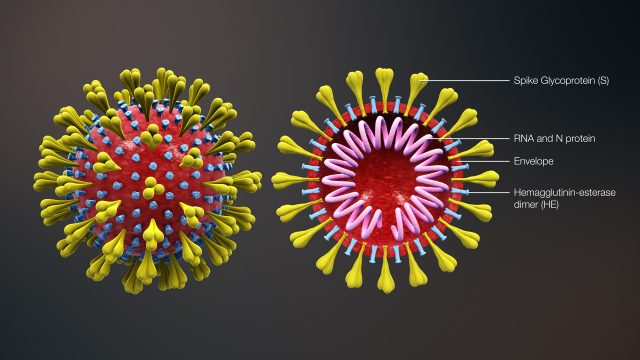

In [141]:
Image("pic1.jpg")

# Part 4: Forecasting Total Number of Cases Worldwide

## Prophet
Prophet is open source software released by Facebook’s Core Data Science team. It is available for download on CRAN and PyPI.

We use Prophet, a procedure for forecasting time series data based on an additive model where non-linear trends are fit with yearly, weekly, and daily seasonality, plus holiday effects. It works best with time series that have strong seasonal effects and several seasons of historical data. Prophet is robust to missing data and shifts in the trend, and typically handles outliers well. 

## Why Prophet?

* **Accurate and fast:**  Prophet is used in many applications across Facebook for producing reliable forecasts for planning and goal setting. Facebook finds it to perform better than any other approach in the majority of cases. It fit models in [Stan](https://mc-stan.org/) so that you get forecasts in just a few seconds.

* **Fully automatic:** Get a reasonable forecast on messy data with no manual effort. Prophet is robust to outliers, missing data, and dramatic changes in your time series.

* **Tunable forecasts:** The Prophet procedure includes many possibilities for users to tweak and adjust forecasts. You can use human-interpretable parameters to improve your forecast by adding your domain knowledge

* **Available in R or Python:** Facebook has implemented the Prophet procedure in R and Python. Both of them share the same underlying Stan code for fitting. You can use whatever language you’re comfortable with to get forecasts. 


## References 
- https://facebook.github.io/prophet/
- https://facebook.github.io/prophet/docs/
- https://github.com/facebook/prophet
- https://facebook.github.io/prophet/docs/quick_start.html

In [142]:
from fbprophet import Prophet

In [143]:
confirmed = df.groupby('Date').sum()['Confirmed'].reset_index()
deaths = df.groupby('Date').sum()['Deaths'].reset_index()
recovered = df.groupby('Date').sum()['Recovered'].reset_index()

The input to Prophet is always a dataframe with two columns: **ds** and **y**. The **ds (datestamp)** column should be of a format expected by Pandas, ideally YYYY-MM-DD for a date or YYYY-MM-DD HH:MM:SS for a timestamp. The y column must be numeric, and represents the measurement we wish to forecast.

In [144]:
confirmed.columns = ['ds','y']
#confirmed['ds'] = confirmed['ds'].dt.date
confirmed['ds'] = pd.to_datetime(confirmed['ds'])

In [145]:
confirmed.tail()

,ds,y
49,2020-03-11,125865.0
50,2020-03-12,128343.0
51,2020-03-13,145193.0
52,2020-03-14,156099.0
53,2020-03-15,167447.0



##4.1 Forecasting Confirmed NCOVID-19 Cases Worldwide with Prophet (Base model)

Generating a week ahead forecast of confirmed cases of NCOVID-19 using Prophet, with 95% prediction interval by creating a base model with no tweaking of seasonality-related parameters and additional regressors.

In [146]:
m = Prophet(interval_width=0.95)
m.fit(confirmed)
future = m.make_future_dataframe(periods=12)
future.tail()

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds
61,2020-03-23
62,2020-03-24
63,2020-03-25
64,2020-03-26
65,2020-03-27


The **predict** method will assign each row in future a predicted value which it names **yhat**. If you pass in historical dates, it will provide an in-sample fit. The **forecast object** here is a new dataframe that includes a column yhat with the forecast, as well as columns for components and uncertainty intervals.

In [147]:
#predicting the future with date, and upper and lower limit of y value
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
61,2020-03-23,164093.851029,149434.992166,178539.076293
62,2020-03-24,167286.959389,152999.931085,182382.402587
63,2020-03-25,171347.629646,156447.888262,186626.207622
64,2020-03-26,175229.215038,159679.264771,190053.629670
65,2020-03-27,180009.549016,164542.758712,194698.960025


You can plot the forecast by calling the Prophet.plot method and passing in your forecast dataframe.

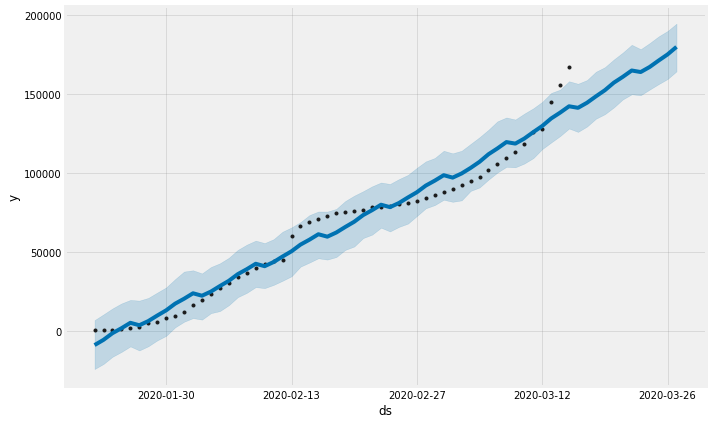

In [148]:
confirmed_forecast_plot = m.plot(forecast)

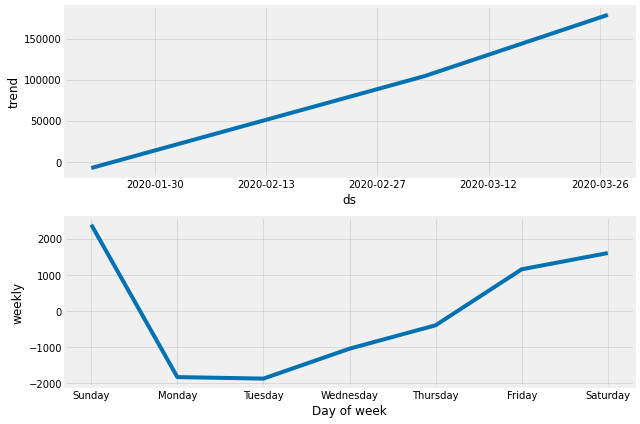

In [149]:
confirmed_forecast_plot =m.plot_components(forecast)

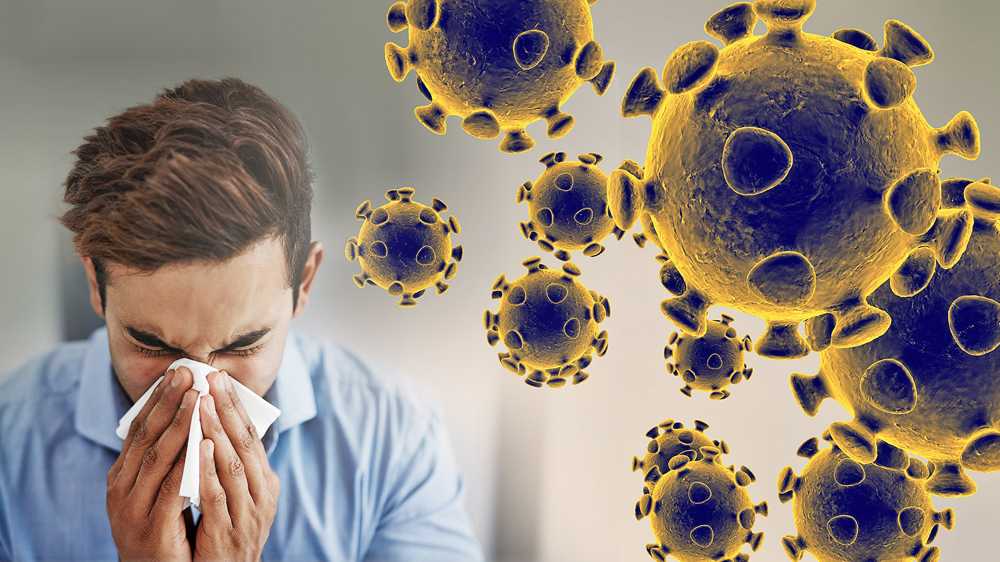

In [150]:
Image("piccovid.jpg")

##4.2 Forecasting Worldwide Deaths using Prophet (Base model)

Generating a week ahead forecast of confirmed cases of NCOVID-19 using Prophet, with 95% prediction interval by creating a base model with no tweaking of seasonality-related parameters and additional regressors.

In [151]:
deaths.columns = ['ds','y']
deaths['ds'] = pd.to_datetime(deaths['ds'])

In [152]:
m = Prophet(interval_width=0.95)
m.fit(deaths)
future = m.make_future_dataframe(periods=12)
future.tail()

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds
61,2020-03-23
62,2020-03-24
63,2020-03-25
64,2020-03-26
65,2020-03-27


In [153]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
61,2020-03-23,7094.159684,6670.248405,7546.803007
62,2020-03-24,7300.721064,6895.226371,7724.294983
63,2020-03-25,7539.129851,7105.331269,7952.998242
64,2020-03-26,7717.983739,7298.260776,8203.539001
65,2020-03-27,7948.698759,7501.422300,8410.182576


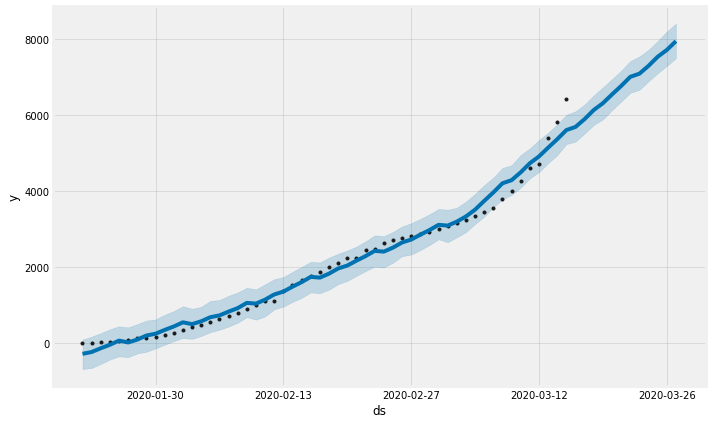

In [154]:
deaths_forecast_plot = m.plot(forecast)

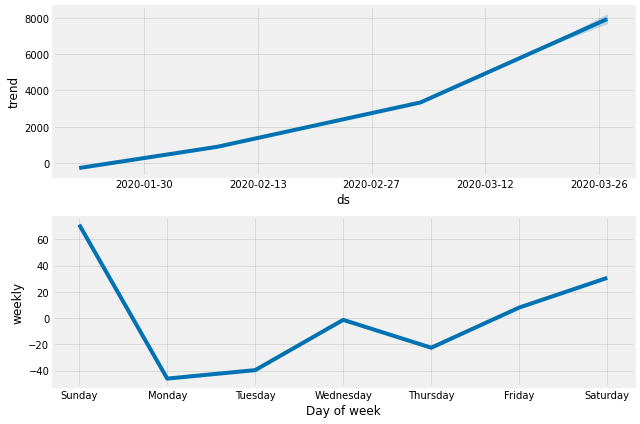

In [155]:
deaths_forecast_plot = m.plot_components(forecast)

## <font color= darkyellow> Forecasting Worldwide Recovered Cases with Prophet (Base model)

Generating a week ahead forecast of confirmed cases of NCOVID-19 using Prophet, with 95% prediction interval by creating a base model with no tweaking of seasonality-related parameters and additional regressors.

In [156]:
recovered.columns = ['ds','y']
recovered['ds'] = pd.to_datetime(recovered['ds'])

In [157]:
m = Prophet(interval_width=0.95)
m.fit(recovered)
future = m.make_future_dataframe(periods=12)
future.tail()

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds
61,2020-03-23
62,2020-03-24
63,2020-03-25
64,2020-03-26
65,2020-03-27


In [158]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
61,2020-03-23,92590.125462,88400.537616,97127.272264
62,2020-03-24,94721.351029,89878.755102,99852.393354
63,2020-03-25,96804.120211,90991.681638,102972.574498
64,2020-03-26,98960.271243,92391.416780,105856.492001
65,2020-03-27,101066.141540,93426.501692,109009.814649


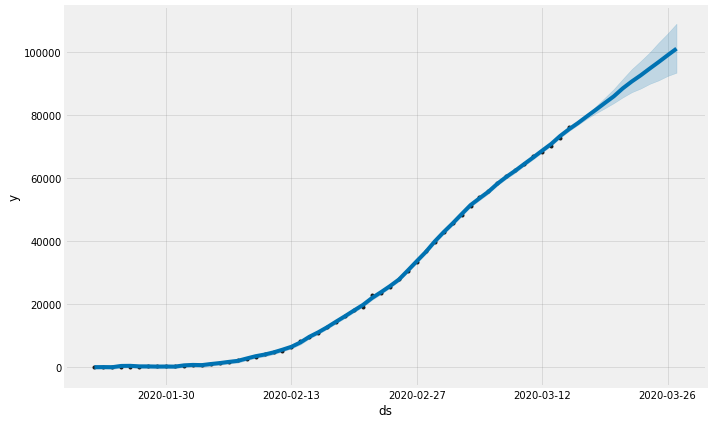

In [159]:
recovered_forecast_plot = m.plot(forecast)

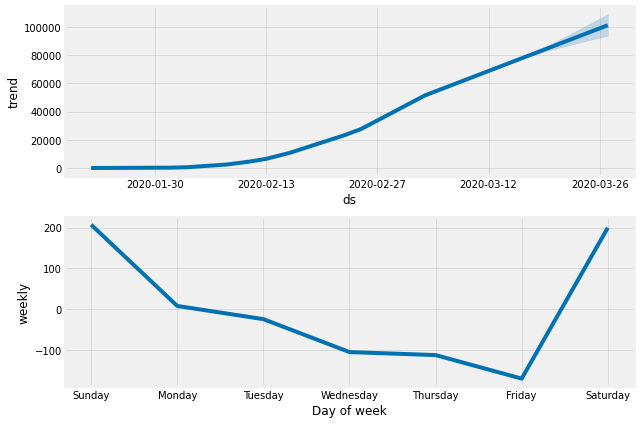

In [160]:
recovered_forecast_plot = m.plot_components(forecast)


## <font color= darkyellow>Inference from the above Analysis and Forecast
### Will Pakistan become the next Italy/ S.Korea/ Wuhan?


- Thankyou everyone for staying at home/indoors today. This will definitely help us tackle the situation. It won't stop the pandemic, but it would definitely help us reduce the exponential rate at which it is increasing. 
- Let's quarantine ourselves, and save ourselves and others you love.
- Let's give a hand in fighting this pandemic atleast by staying indoors and protecting you and your family. 
- Go and get a checkup done in case you are suffering from cough,cold, fever, shortness of breath and breathing difficulties. Can't tell for sure but(due to lack of data) , but it might be possible that we don't have the exact number of the COVID-19 cases in India becasuse sometimes it takes weeks to see the first sign/symptom for it. 
- If you're not getting the checkup done, you might add in spreading the virus unintentionally


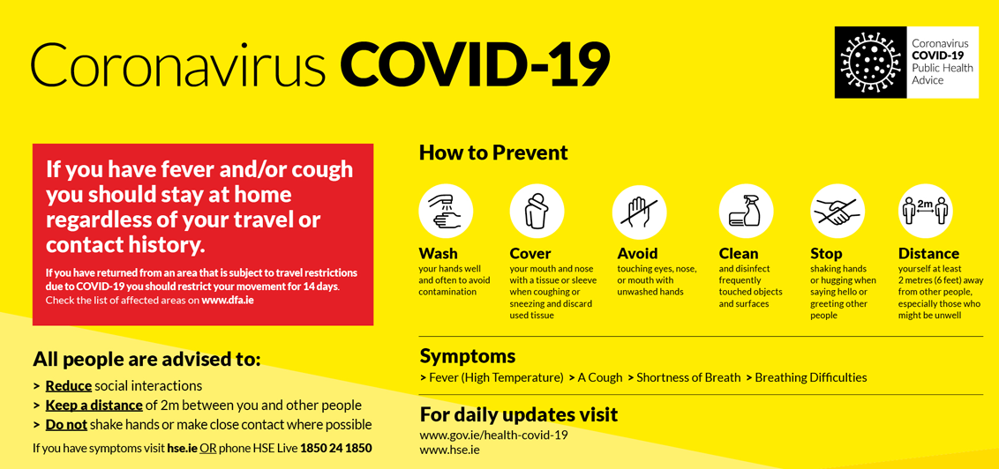

In [161]:
Image("covid.png")



<font color = darkgreen> Zeeshan
Student at iqra.edu.pk
Reg# 35342  - BSCS - 4th year
Emial: imzeeshan.ai@gmail.com ---------------------------------(Copy Right 2020 - By Zeeshan)
    </font>